In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Tensorflow-Models

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1oP3ewZgiatY88SU5esvVcTCqbdfjYu1d/Tensorflow-Models


In [3]:
!python --version

Python 3.11.13


In [ ]:
!pip install tensorflow==2.18.0

In [ ]:
!pip install -U -q "tf-models-official"

In [4]:
import os
import io
import pprint
import tempfile
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen

In [5]:
import os
import json
import math
import io
import collections
import numpy as np
import tensorflow as tf

from PIL import Image
from pycocotools import mask as coco_mask
from tqdm import tqdm

In [6]:
import orbit
import tensorflow_models as tfm

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.19.1


In [7]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/markerpensseg/train")
count_images("datasets/markerpensseg/valid")

Total images: 225
Total images: 30


In [8]:
# Check train annotations
with open("datasets/markerpensseg/train/_annotations.coco.json") as f:
    train_data = json.load(f)
    print(f"Train images: {len(train_data['images'])}")
    print(f"Train annotations: {len(train_data['annotations'])}")
    print(f"Categories: {train_data['categories']}")

# Check validation
with open("datasets/markerpensseg/valid/_annotations.coco.json") as f:
    valid_data = json.load(f)
    print(f"\nValid images: {len(valid_data['images'])}")
    print(f"Valid annotations: {len(valid_data['annotations'])}")

Train images: 225
Train annotations: 450
Categories: [{'id': 0, 'name': 'caps-7o2C', 'supercategory': 'none'}, {'id': 1, 'name': 'CAP', 'supercategory': 'caps-7o2C'}]

Valid images: 30
Valid annotations: 60


In [ ]:
def int64_feature(value):
    if isinstance(value, list):
        return tf.train.Feature(int64_list=tf.train.Int64List(value=value))
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

def float_feature(value):
    if isinstance(value, list):
        return tf.train.Feature(float_list=tf.train.FloatList(value=value))
    return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def bytes_feature(value):
    if isinstance(value, list):
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=value))
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

class CocoDataset:
    def __init__(self, annotation_file):
        with open(annotation_file, "r") as f:
            data = json.load(f)

        self.images = {img["id"]: img for img in data["images"]}
        self.categories = {cat["id"]: cat["name"] for cat in data["categories"]}

        self.img_to_anns = collections.defaultdict(list)
        for ann in data["annotations"]:
            self.img_to_anns[ann["image_id"]].append(ann)

def encode_binary_mask(mask):
    pil_mask = Image.fromarray(mask.astype(np.uint8))  # NO *255
    buf = io.BytesIO()
    pil_mask.save(buf, format="PNG")
    return buf.getvalue()

def decode_annotation_mask(ann, height, width):
    seg = ann["segmentation"]

    # Polygon
    if isinstance(seg, list):
        rles = coco_mask.frPyObjects(seg, height, width)
        rle = coco_mask.merge(rles)

    # RLE dict
    elif isinstance(seg, dict):
        rle = seg

    else:
        raise ValueError(f"Unknown segmentation type: {type(seg)}")

    mask = coco_mask.decode(rle)
    return mask.astype(np.uint8)

def create_tf_example(image_dir, image_info, annotations, category_id_to_name):
    image_path = os.path.join(image_dir, image_info["file_name"])
    encoded_image = tf.io.read_file(image_path).numpy()

    width = image_info["width"]
    height = image_info["height"]

    annotations = [a for a in annotations if a.get("iscrowd", 0) == 0]
    if not annotations:
        return None

    xmins, xmaxs, ymins, ymaxs = [], [], [], []
    classes, classes_text = [], []
    is_crowd, areas, masks = [], [], []

    for ann in annotations:
        x, y, w, h = ann["bbox"]
        xmins.append(x / width)
        xmaxs.append((x + w) / width)
        ymins.append(y / height)
        ymaxs.append((y + h) / height)

        classes.append(ann["category_id"])
        classes_text.append(
            category_id_to_name[ann["category_id"]].encode("utf8")
        )

        is_crowd.append(0)
        areas.append(float(ann["area"]))

        mask = decode_annotation_mask(ann, height, width)
        masks.append(encode_binary_mask(mask))

    features = {
        "image/encoded": bytes_feature(encoded_image),
        "image/filename": bytes_feature(image_info["file_name"].encode("utf8")),
        "image/format": bytes_feature(b"jpg"),
        "image/height": int64_feature(height),
        "image/width": int64_feature(width),
        "image/source_id": bytes_feature(str(image_info["id"]).encode("utf8")),

        "image/object/bbox/xmin": float_feature(xmins),
        "image/object/bbox/xmax": float_feature(xmaxs),
        "image/object/bbox/ymin": float_feature(ymins),
        "image/object/bbox/ymax": float_feature(ymaxs),

        "image/object/class/label": int64_feature(classes),
        "image/object/class/text": bytes_feature(classes_text),
        "image/object/is_crowd": int64_feature(is_crowd),
        "image/object/area": float_feature(areas),
        "image/object/mask": bytes_feature(masks),
    }

    return tf.train.Example(features=tf.train.Features(feature=features))

def write_tfrecords(
    image_dir,
    annotation_file,
    output_path,
    num_shards=5,
):
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    coco = CocoDataset(annotation_file)
    image_ids = list(coco.images.keys())
    category_map = coco.categories

    writers = []
    for i in range(num_shards):
        writers.append(
            tf.io.TFRecordWriter(
                f"{output_path}-{i:05d}-of-{num_shards:05d}.tfrecord"
            )
        )

    for idx, image_id in enumerate(tqdm(image_ids)):
        image_info = coco.images[image_id]
        anns = coco.img_to_anns.get(image_id, [])
        if len(anns) == 0:
            continue

        tf_example = create_tf_example(
            image_dir, image_info, anns, category_map
        )
        writers[idx % num_shards].write(
            tf_example.SerializeToString()
        )

    for w in writers:
        w.close()

In [ ]:
write_tfrecords(
    image_dir="datasets/markerpensseg/train",
    annotation_file="datasets/markerpensseg/train/_annotations.coco.json",
    output_path="datasets/markerpensseg/tfrecords/train",
    num_shards=5,
)

write_tfrecords(
    image_dir="datasets/markerpensseg/valid",
    annotation_file="datasets/markerpensseg/valid/_annotations.coco.json",
    output_path="datasets/markerpensseg/tfrecords/val",
    num_shards=5,
)

100%|██████████| 30/30 [00:15<00:00,  1.90it/s]


In [9]:
NUM_CLASSES = 1
category_ids = [1]

In [10]:
train_data_input_path = 'datasets/markerpensseg/tfrecords/train*'
valid_data_input_path = 'datasets/markerpensseg/tfrecords/val*'
model_dir = './seg_trained_model/'
export_dir ='./seg_exported_model/'

In [11]:
if not os.path.exists(model_dir):
  os.mkdir(model_dir)

In [12]:
exp_config = exp_factory.get_exp_config('maskrcnn_mobilenet_coco')

In [13]:
model_ckpt_path = './model_ckpt/'
if not os.path.exists(model_ckpt_path):
  os.mkdir(model_ckpt_path)

!gsutil cp gs://tf_model_garden/vision/mobilenet/v2_1.0_float/ckpt-180648.data-00000-of-00001 './model_ckpt/'
!gsutil cp gs://tf_model_garden/vision/mobilenet/v2_1.0_float/ckpt-180648.index './model_ckpt/'

Copying gs://tf_model_garden/vision/mobilenet/v2_1.0_float/ckpt-180648.data-00000-of-00001...
| [1 files][ 26.9 MiB/ 26.9 MiB]                                                
Operation completed over 1 objects/26.9 MiB.                                     
Copying gs://tf_model_garden/vision/mobilenet/v2_1.0_float/ckpt-180648.index...
/ [1 files][  7.5 KiB/  7.5 KiB]                                                
Operation completed over 1 objects/7.5 KiB.                                      


In [14]:
BATCH_SIZE = 12
HEIGHT, WIDTH = 256, 256
IMG_SHAPE = [HEIGHT, WIDTH, 3]

# Backbone Config
exp_config.task.annotation_file = None
exp_config.task.freeze_backbone = True
exp_config.task.init_checkpoint = "./model_ckpt/ckpt-180648"
# exp_config.task.init_checkpoint = "./seg_trained_model/ckpt-1190"
exp_config.task.init_checkpoint_modules = "backbone"
# exp_config.task.init_checkpoint_modules = "mask_rcnn"

# Model Config
exp_config.task.model.num_classes = NUM_CLASSES + 1
exp_config.task.model.input_size = IMG_SHAPE

# Training Data Config
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = BATCH_SIZE
exp_config.task.train_data.shuffle_buffer_size = 64
exp_config.task.train_data.parser.aug_scale_max = 1.0
exp_config.task.train_data.parser.aug_scale_min = 1.0

# Validation Data Config
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = BATCH_SIZE

In [15]:
logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'

# extremely slow even on GPU with toy datasets
train_steps = 360
exp_config.trainer.steps_per_loop = 18 # steps_per_loop = num_of_training_examples // train_batch_size

exp_config.trainer.summary_interval = 18
exp_config.trainer.checkpoint_interval = 18
exp_config.trainer.validation_interval = 18
exp_config.trainer.validation_steps =  2 # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = 18
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.07
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

This may be broken in Colab.


In [16]:
pp.pprint(exp_config.as_dict())
display.Javascript("google.colab.output.setIframeHeight('500px');")

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'allowed_mask_class_ids': None,
                'annotation_file': None,
        

<IPython.core.display.Javascript object>

In [17]:
# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

Done


In [18]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

In [20]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')


images.shape: (12, 256, 256, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['anchor_boxes', 'image_info', 'rpn_score_targets', 'rpn_box_targets', 'gt_boxes', 'gt_classes', 'gt_outer_boxes', 'gt_masks'])


In [21]:
tf_ex_decoder = TfExampleDecoder(include_mask=True)

In [22]:
category_index={
    1: {
        'id': 1,
        'name': 'CAP'
       }
}

In [23]:
def show_batch(raw_records):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    # print(decoded_tensors['groundtruth_instance_masks'].numpy().shape)
    # print(decoded_tensors.keys())
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        min_score_thresh=min_score_thresh,
        instance_masks=decoded_tensors['groundtruth_instance_masks'].numpy().astype('uint8'),
        line_thickness=4)

    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image-{i+1}")
  plt.show()

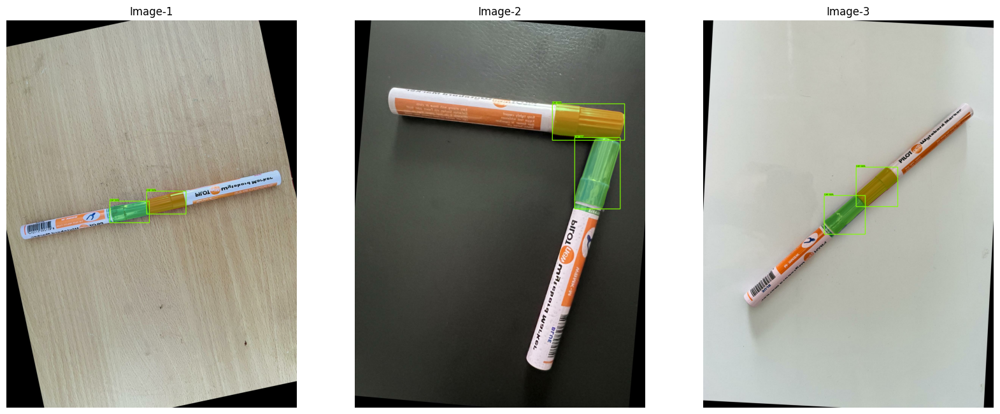

In [ ]:
buffer_size = 100
num_of_examples = 3

train_tfrecords = tf.io.gfile.glob(exp_config.task.train_data.input_path)
raw_records = tf.data.TFRecordDataset(train_tfrecords).shuffle(buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records)

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['6'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)
/usr/local/lib/python3.11/dist-packages/tf_keras/src/initializers/initializers.py:121: UserWarning: The initializer VarianceScaling is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
restoring or initializing model...
train | step:      0 | training until step 18...
train | step:     18 | steps/sec:    0.3 | output: 
    {'frcnn_box_loss': 0.3482474,
     'frcnn_cls_loss': 0.1304568,
     'learning_rate': 0.06828698,
     'mask_loss': 1.4659566,
     'model_loss': 2.2571409,
     'rpn_box_loss': 0.027405404,
     'rpn_score_loss': 0.2850745,
     'total_loss': 2.5606282,
     'training_loss': 2.5606282}
saved checkpoint to ./seg_trained_model/ckpt-18.
 eval | step:     18 | running 2 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.13s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | ma

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['6'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)
/usr/local/lib/python3.11/dist-packages/tf_keras/src/initializers/initializers.py:121: UserWarning: The initializer VarianceScaling is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
restoring or initializing model...
restored model from ./seg_trained_model/ckpt-180.
restored from checkpoint: ./seg_trained_model/ckpt-180
train | step:    180 | training until step 198...
train | step:    198 | steps/sec:    0.3 | output: 
    {'frcnn_box_loss': 0.14049387,
     'frcnn_cls_loss': 0.026198996,
     'learning_rate': 0.029524792,
     'mask_loss': 0.29793805,
     'model_loss': 0.5004335,
     'rpn_box_loss': 0.0086096,
     'rpn_score_loss': 0.027193,
     'total_loss': 0.8057263,
     'training_loss': 0.8057263}
saved checkpoint to ./seg_trained_model/ckpt-198.
 eval | step:    198 | running 2 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.24s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.475
 Average Precision  (AP) @[ IoU

In [ ]:
%load_ext tensorboard
%tensorboard --logdir './seg_trained_model/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 25861), started 1:49:54 ago. (Use '!kill 25861' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['6'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


In [24]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)

def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

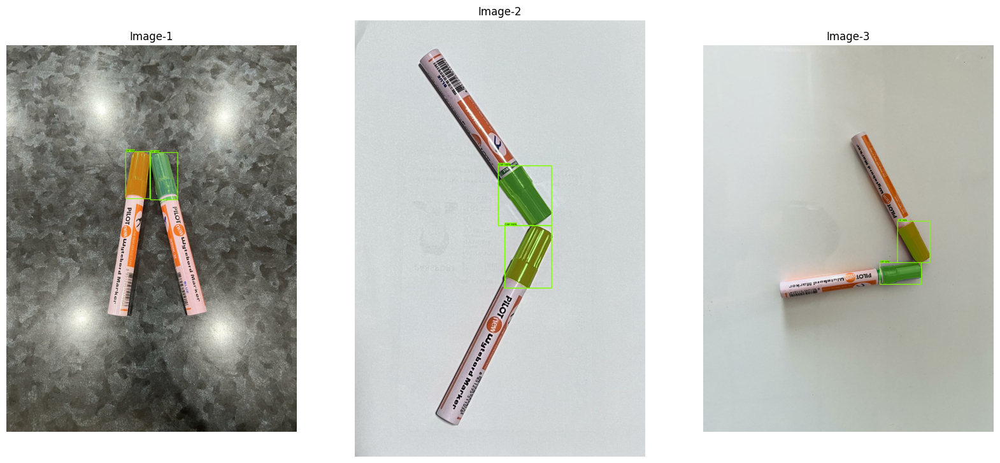

In [ ]:
num_of_examples = 3

test_tfrecords = tf.io.gfile.glob('datasets/markerpensseg/tfrecords/val*')
test_ds = tf.data.TFRecordDataset(test_tfrecords).shuffle(buffer_size=buffer_size).take(num_of_examples)
show_batch(test_ds)

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

In [26]:
def reframe_image_corners_relative_to_boxes(boxes):
  """Reframe the image corners ([0, 0, 1, 1]) to be relative to boxes.
  The local coordinate frame of each box is assumed to be relative to
  its own for corners.
  Args:
    boxes: A float tensor of [num_boxes, 4] of (ymin, xmin, ymax, xmax)
      coordinates in relative coordinate space of each bounding box.
  Returns:
    reframed_boxes: Reframes boxes with same shape as input.
  """
  ymin, xmin, ymax, xmax = (boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3])

  height = tf.maximum(ymax - ymin, 1e-4)
  width = tf.maximum(xmax - xmin, 1e-4)

  ymin_out = (0 - ymin) / height
  xmin_out = (0 - xmin) / width
  ymax_out = (1 - ymin) / height
  xmax_out = (1 - xmin) / width
  return tf.stack([ymin_out, xmin_out, ymax_out, xmax_out], axis=1)

def reframe_box_masks_to_image_masks(box_masks, boxes, image_height,
                                     image_width, resize_method='bilinear'):
  """Transforms the box masks back to full image masks.
  Embeds masks in bounding boxes of larger masks whose shapes correspond to
  image shape.
  Args:
    box_masks: A tensor of size [num_masks, mask_height, mask_width].
    boxes: A tf.float32 tensor of size [num_masks, 4] containing the box
           corners. Row i contains [ymin, xmin, ymax, xmax] of the box
           corresponding to mask i. Note that the box corners are in
           normalized coordinates.
    image_height: Image height. The output mask will have the same height as
                  the image height.
    image_width: Image width. The output mask will have the same width as the
                 image width.
    resize_method: The resize method, either 'bilinear' or 'nearest'. Note that
      'bilinear' is only respected if box_masks is a float.
  Returns:
    A tensor of size [num_masks, image_height, image_width] with the same dtype
    as `box_masks`.
  """
  resize_method = 'nearest' if box_masks.dtype == tf.uint8 else resize_method
  # TODO(rathodv): Make this a public function.
  def reframe_box_masks_to_image_masks_default():
    """The default function when there are more than 0 box masks."""

    num_boxes = tf.shape(box_masks)[0]
    box_masks_expanded = tf.expand_dims(box_masks, axis=3)

    resized_crops = tf.image.crop_and_resize(
        image=box_masks_expanded,
        boxes=reframe_image_corners_relative_to_boxes(boxes),
        box_indices=tf.range(num_boxes),
        crop_size=[image_height, image_width],
        method=resize_method,
        extrapolation_value=0)
    return tf.cast(resized_crops, box_masks.dtype)

  image_masks = tf.cond(
      tf.shape(box_masks)[0] > 0,
      reframe_box_masks_to_image_masks_default,
      lambda: tf.zeros([0, image_height, image_width, 1], box_masks.dtype))
  return tf.squeeze(image_masks, axis=3)

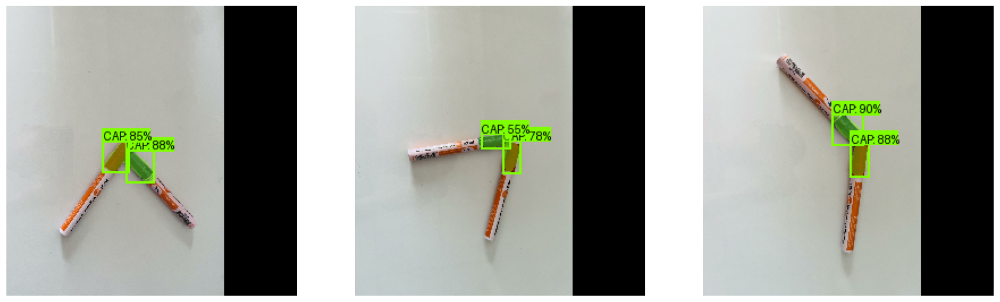

In [ ]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.40 # Change minimum score for threshold to see all bounding boxes confidences

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  # Visualize detection and masks
  if 'detection_masks' in result:
    # we need to convert np.arrays to tensors
    detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
    detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])
    detection_masks_reframed = reframe_box_masks_to_image_masks(
              detection_masks, detection_boxes/256.0,
                image_np.shape[0], image_np.shape[1])
    detection_masks_reframed = tf.cast(
        detection_masks_reframed > min_score_thresh,
        np.uint8)

    result['detection_masks_reframed'] = detection_masks_reframed.numpy()
  visualization_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        result['detection_boxes'][0].numpy(),
        (result['detection_classes'][0] + 0).numpy().astype(int),
        result['detection_scores'][0].numpy(),
        category_index=category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=10,
        min_score_thresh=min_score_thresh,
        instance_masks=result.get('detection_masks_reframed', None),
        line_thickness=2)

  plt.imshow(image_np)
  plt.axis("off")

plt.show()

In [ ]:
# Serialize the model as a SavedModel.
# Use model.export for Keras models

# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("seg_exported_model")

# Enable TF Select ops for unsupported operations
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,
    tf.lite.OpsSet.SELECT_TF_OPS # Enable TF Select ops
]

# No optimizations
tflite_model = converter.convert()
open("markerpens_seg_TFM.tflite", "wb").write(tflite_model)

/usr/local/lib/python3.11/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 28, 28)
  Output type=<class 'numpy.ndarray'>, shape=(1, 4, 2)
TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 28, 28)
  Output type=<class 'numpy.ndarray'>, shape=(1, 4, 2)
TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class '

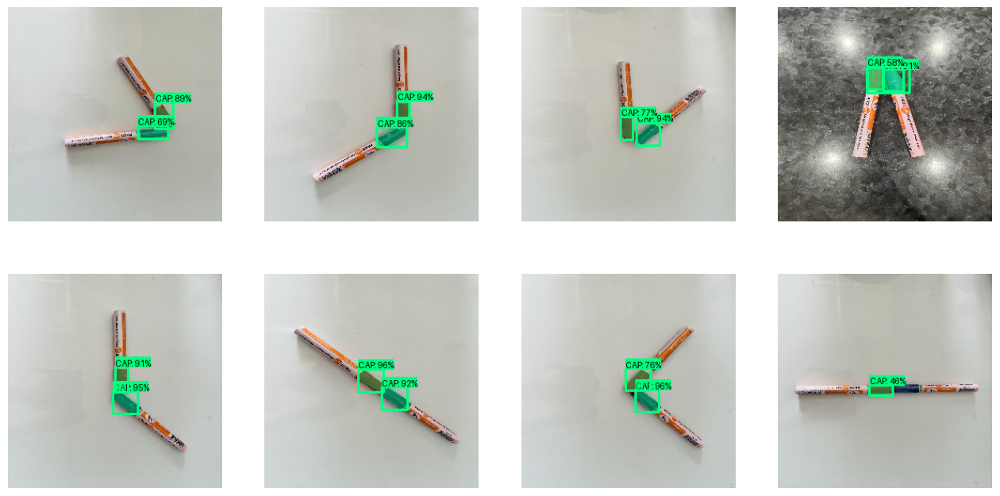

In [30]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/My Drive/Tensorflow-Models/datasets/markerpensseg/valid"

min_score_thresh = 0.4
# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 256   # TFLite model input height
MODEL_W = 256   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="markerpens_seg_TFM.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(2, 4, i+1)
    input_image = cv2.resize(image, (256, 256))
    image_np = input_image.copy()
    input_image = input_image[:,:,::-1]
    input_image = np.expand_dims(input_image, 0)

    input_data = (input_image).astype(np.uint8)
    interpreter.set_tensor(input_details[0]["index"], input_data)

    # run inference
    interpreter.invoke()

    # get outputs
    tflite_outputs = []
    print("TFLite outputs types and shapes:")
    for out_detail in output_details:
        output_tensor = interpreter.get_tensor(out_detail["index"])
        tflite_outputs.append(output_tensor)
        print(f"  Output type={type(output_tensor)}, shape={output_tensor.shape}")

    detection_masks = tflite_outputs[4][0]
    detection_boxes = tflite_outputs[1][0]
    detection_masks_reframed = reframe_box_masks_to_image_masks(
              detection_masks, detection_boxes/256.0,
                image_np.shape[0], image_np.shape[1])
    detection_masks_reframed = tf.cast(
        detection_masks_reframed > min_score_thresh,
        np.uint8)

    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        tflite_outputs[1][0],
        tflite_outputs[2][0].astype(int),
        tflite_outputs[3][0],
        category_index=category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=10,
        min_score_thresh=min_score_thresh,
        instance_masks=detection_masks_reframed.numpy(),
        line_thickness=3)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    plt.imshow(image_np)
    plt.axis('off')

plt.show()